In [186]:
import nltk
import re
import pymorphy2
from collections import Counter
nltk.download('stopwords')
import pandas as pd
import numpy as np
import gensim
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from tqdm import tqdm_notebook
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing  import StandardScaler
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.compose import ColumnTransformer
from sklearn.metrics import f1_score
from IPython.core.display import HTML, display

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
C:\Users\User\AppData\Local\Temp\ipykernel_12204\2099189566.py:21: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import HTML, display


In [187]:
train_df = pd.read_csv("train.csv")

train_df.head()

,id,url,title,target
0,0,m.kp.md,"Экс-министр экономики Молдовы - главе МИДЭИ, ц...",False
1,1,www.kp.by,Эта песня стала известна многим телезрителям б...,False
2,2,fanserials.tv,Банши 4 сезон 2 серия Бремя красоты смотреть о...,False
3,3,colorbox.spb.ru,Не Беси Меня Картинки,False
4,4,tula-sport.ru,В Новомосковске сыграют следж-хоккеисты алекси...,False


In [188]:
ans_df = pd.read_csv("test.csv")

ans_df.head()

,id,url,title
0,135309,www.kommersant.ru,Шестой кассационный суд в Самаре начнет работу...
1,135310,urexpert.online,"Что такое индексация алиментов, кем и в каких ..."
2,135311,imperimeha.ru,Женщинам | Империя Меха - Part 12
3,135312,national-porn.com,"Небритые, волосатые киски: Порно всех стран и ..."
4,135313,2gis.ru,67


In [189]:
train_df["target"].value_counts()

target
False    118594
True      16715
Name: count, dtype: int64

In [190]:
from sklearn.metrics import f1_score

In [191]:
X_train = train_df["title"].values
X_ans = ans_df["title"].values
y_train = train_df["target"].astype(int).values

# Предобработка данных

<Axes: >

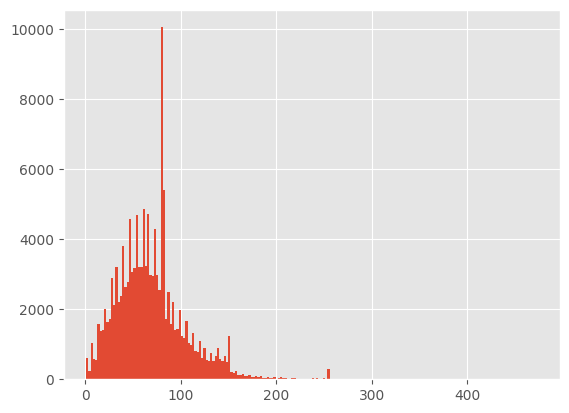

In [192]:
train_df.title.str.len().hist(bins=200)

In [193]:
train_df.title.str.len().mean()

69.51917107635911

In [364]:
TOKEN_PATTERN = "[a-zа-яё]+"

def tokenize(text):
    return re.findall(TOKEN_PATTERN, text.lower())

docs_train = [tokenize(str(text)) for text in X_train]
docs_ans = [tokenize(str(text)) for text in X_ans]

In [ ]:
occurence = Counter([token for doc in docs_train for token in docs_train])

In [366]:
len(occurence)

164142

In [367]:
stopword_set = nltk.corpus.stopwords.words('russian') + nltk.corpus.stopwords.words('english')
stopword_set

['и',
 'в',
 'во',
 'не',
 'что',
 'он',
 'на',
 'я',
 'с',
 'со',
 'как',
 'а',
 'то',
 'все',
 'она',
 'так',
 'его',
 'но',
 'да',
 'ты',
 'к',
 'у',
 'же',
 'вы',
 'за',
 'бы',
 'по',
 'только',
 'ее',
 'мне',
 'было',
 'вот',
 'от',
 'меня',
 'еще',
 'нет',
 'о',
 'из',
 'ему',
 'теперь',
 'когда',
 'даже',
 'ну',
 'вдруг',
 'ли',
 'если',
 'уже',
 'или',
 'ни',
 'быть',
 'был',
 'него',
 'до',
 'вас',
 'нибудь',
 'опять',
 'уж',
 'вам',
 'ведь',
 'там',
 'потом',
 'себя',
 'ничего',
 'ей',
 'может',
 'они',
 'тут',
 'где',
 'есть',
 'надо',
 'ней',
 'для',
 'мы',
 'тебя',
 'их',
 'чем',
 'была',
 'сам',
 'чтоб',
 'без',
 'будто',
 'чего',
 'раз',
 'тоже',
 'себе',
 'под',
 'будет',
 'ж',
 'тогда',
 'кто',
 'этот',
 'того',
 'потому',
 'этого',
 'какой',
 'совсем',
 'ним',
 'здесь',
 'этом',
 'один',
 'почти',
 'мой',
 'тем',
 'чтобы',
 'нее',
 'сейчас',
 'были',
 'куда',
 'зачем',
 'всех',
 'никогда',
 'можно',
 'при',
 'наконец',
 'два',
 'об',
 'другой',
 'хоть',
 'после',
 'на

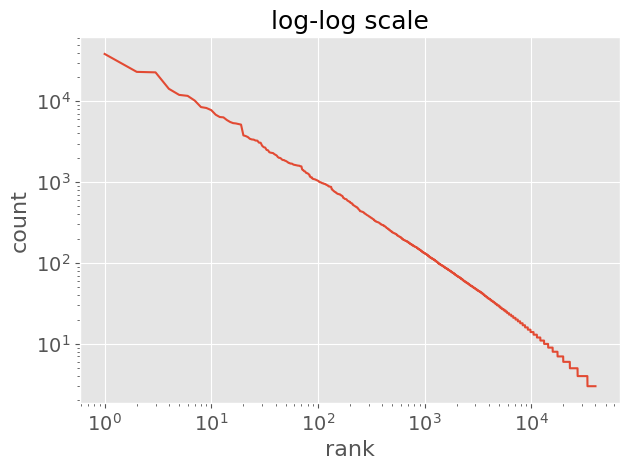

In [368]:
max_rank = 40000
counts = [count for _, count in occurence.most_common()[:40000]]
plt.plot(range(1, len(counts) + 1), counts)
plt.title('log-log scale', fontsize=18)
plt.yscale('log')
plt.xscale('log')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel('rank', fontsize=16)
plt.ylabel('count', fontsize=16)
plt.tight_layout()
plt.show()

In [369]:
sorted_tokens = sorted(occurence.keys())
sorted_tokens

['a',
 'aa',
 'aaa',
 'aaaaa',
 'aac',
 'aact',
 'aagum',
 'aahd',
 'aai',
 'aaja',
 'aaliyah',
 'aalliyahh',
 'aalw',
 'aamir',
 'aan',
 'aanlyn',
 'aaoge',
 'aap',
 'aapwp',
 'aaqa',
 'aarin',
 'aarina',
 'aarы',
 'aasan',
 'aasen',
 'aashiqui',
 'aastrid',
 'aat',
 'aaw',
 'aax',
 'aaya',
 'aaye',
 'aayega',
 'ab',
 'abadir',
 'abadiya',
 'abadiyot',
 'abagelle',
 'abah',
 'abal',
 'abalis',
 'abanca',
 'abandoned',
 'abandonware',
 'abap',
 'abarth',
 'abat',
 'abb',
 'abba',
 'abbey',
 'abbie',
 'abbotts',
 'abbreviati',
 'abby',
 'abbywinters',
 'abbyy',
 'abc',
 'abcbkz',
 'abcd',
 'abcde',
 'abce',
 'abd',
 'abdel',
 'abdl',
 'abdomenului',
 'abducted',
 'abductions',
 'abdujalil',
 'abdul',
 'abdulhakim',
 'abdulla',
 'abdullayeva',
 'abdulloh',
 'abdurrahman',
 'abduvali',
 'abdydayy',
 'abe',
 'abea',
 'abejrb',
 'abel',
 'abella',
 'abellas',
 'abenewco',
 'abengoa',
 'abenteuer',
 'aberdeen',
 'aberhof',
 'abf',
 'abg',
 'abgeschnitten',
 'abh',
 'abi',
 'abidjan',
 'abier

In [199]:
stemmer = nltk.stem.SnowballStemmer('russian')

def stemming(text):
    return [stemmer.stem(token) for token in text.split()]

stemming(X_train[0])

['экс-министр',
 'экономик',
 'молдов',
 '-',
 'глав',
 'мидэи,',
 'цел',
 'котор',
 'сдела',
 'из',
 'республик',
 'не',
 'просителя,',
 'а',
 'донора:',
 'над',
 'избега',
 'долг',
 'нахожден',
 'н�']

In [200]:
lemmatizer = pymorphy2.MorphAnalyzer()

In [371]:
lemmatizer_cache = {}

def lemmatize(token):
    if lemmatizer.word_is_known(token):
        if token not in lemmatizer_cache:
            lemmatizer_cache[token] = lemmatizer.parse(token)[0].normal_form
        return lemmatizer_cache[token]
    return token

lemmatized_docs_train = [[lemmatize(token) for token in text] for text in tqdm_notebook(docs_train)]
lemmatized_docs_ans = [[lemmatize(token) for token in text] for text in tqdm_notebook(docs_ans)]

cleared_docs_train = [[token for token in text if token not in stopword_set] for text in lemmatized_docs_train]
cleared_docs_ans = [[token for token in text if token not in stopword_set] for text in lemmatized_docs_ans]

C:\Users\User\AppData\Local\Temp\ipykernel_12204\2072318440.py:10: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  lemmatized_docs_train = [[lemmatize(token) for token in text] for text in tqdm_notebook(docs_train)]


  0%|          | 0/135309 [00:00<?, ?it/s]

C:\Users\User\AppData\Local\Temp\ipykernel_12204\2072318440.py:11: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  lemmatized_docs_ans = [[lemmatize(token) for token in text] for text in tqdm_notebook(docs_ans)]


  0%|          | 0/165378 [00:00<?, ?it/s]

In [205]:
len({token for text in cleared_docs_train for token in text})

119716

In [206]:
occurence.most_common(20)

[('в', 38391),
 ('на', 23049),
 ('и', 22731),
 ('ru', 14234),
 ('онлайн', 11969),
 ('с', 11643),
 ('для', 10175),
 ('по', 8465),
 ('бесплатно', 8243),
 ('скачать', 7751),
 ('mail', 6808),
 ('фото', 6378),
 ('купить', 6315),
 ('страница', 5850),
 ('смотреть', 5542),
 ('от', 5361),
 ('поиск', 5310),
 ('порно', 5217),
 ('видео', 5138),
 ('porn', 3781)]

In [207]:
cooccurence = Counter([(doc[i], doc[i + 1]) for doc in docs for i in range(len(doc) - 1)])

In [208]:
cooccurence.most_common(20)

[(('mail', 'ru'), 6701),
 (('смотреть', 'онлайн'), 3820),
 (('поиск', 'mail'), 3502),
 (('результатов', 'поиск'), 2622),
 (('купить', 'в'), 2107),
 (('скачать', 'бесплатно'), 2012),
 (('онлайн', 'бесплатно'), 1957),
 (('читать', 'онлайн'), 1808),
 (('в', 'хорошем'), 1629),
 (('тыс', 'результатов'), 1611),
 (('порно', 'видео'), 1529),
 (('в', 'интернет'), 1529),
 (('в', 'москве'), 1489),
 (('интернет', 'магазине'), 1419),
 (('интернет', 'магазин'), 1377),
 (('хорошем', 'качестве'), 1361),
 (('бесплатно', 'в'), 1315),
 (('на', 'olx'), 1289),
 (('мой', 'мир'), 1123),
 (('мир', 'mail'), 1054)]

In [209]:
vectorizer = TfidfVectorizer(
    tokenizer=lambda x: x, lowercase=False, max_df = 0.8, min_df = 2, norm = 'l2').fit(cleared_docs)

C:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


In [210]:
docs_tf_idf = vectorizer.transform(cleared_docs[:5000]).toarray()

In [211]:
similarities = docs_tf_idf @ docs_tf_idf.T

In [212]:
def similar_pairs_from_matrix(similarity_matrix, threshold):
    return [
        ((i, j), similarities[i, j])
        for i in range(similarities.shape[0]) for j in range(similarities.shape[1]) 
        if j > i  and similarities[i, j] > threshold
    ]


similar_pairs = similar_pairs_from_matrix(similarities, threshold=0.1) 

In [213]:
similar_pairs

[((0, 11), 0.10249519065903813),
 ((0, 519), 0.10904386955587839),
 ((0, 748), 0.17781638899865046),
 ((0, 1033), 0.10682360957623474),
 ((0, 1359), 0.13936454607674842),
 ((0, 2327), 0.16954519524598327),
 ((0, 2430), 0.11620303167360235),
 ((0, 3106), 0.1737958669201174),
 ((0, 3149), 0.11645857688639998),
 ((1, 301), 0.11949335168544331),
 ((1, 732), 0.11748219997812556),
 ((1, 1250), 0.10693427673406053),
 ((1, 2066), 0.10729018515230121),
 ((1, 2263), 0.1322227056543647),
 ((1, 2632), 0.23733712514667163),
 ((1, 2869), 0.12041755355087047),
 ((1, 3027), 0.1048870026040493),
 ((1, 3237), 0.11141613698556992),
 ((1, 3677), 0.107663173192649),
 ((1, 3783), 0.14921584130349347),
 ((1, 3790), 0.1229529389435936),
 ((1, 4612), 0.12580760311127337),
 ((2, 63), 0.1848200569010543),
 ((2, 67), 0.2231937804221905),
 ((2, 73), 0.11704424208860839),
 ((2, 123), 0.11263457095726995),
 ((2, 134), 0.10170439548245944),
 ((2, 140), 0.18350838242721146),
 ((2, 164), 0.11874985019626061),
 ((2, 182

In [214]:
similar_pairs = sorted(similar_pairs, key = lambda x: x[1])

In [215]:
similar_pairs

[((602, 1228), 0.1000005389684015),
 ((706, 4793), 0.10000092883826865),
 ((1240, 1723), 0.10000106376080502),
 ((1049, 2706), 0.1000011097822095),
 ((2877, 4301), 0.10000139689327485),
 ((301, 4015), 0.10000140258404866),
 ((1339, 2375), 0.1000019405390338),
 ((4262, 4861), 0.10000217080748743),
 ((1853, 4406), 0.10000233148755068),
 ((1896, 3462), 0.10000276982615808),
 ((1829, 1894), 0.10000308108708761),
 ((3664, 3737), 0.10000318105818143),
 ((2804, 3373), 0.10000484899208362),
 ((666, 1137), 0.1000049305413748),
 ((3960, 4598), 0.10000499108457979),
 ((464, 3531), 0.10000519174004861),
 ((709, 4357), 0.10000531833020089),
 ((617, 2617), 0.10000566426857421),
 ((220, 4995), 0.10000589612284073),
 ((969, 3516), 0.10000609062882626),
 ((3010, 3312), 0.10000661693039803),
 ((2831, 3524), 0.1000069941073917),
 ((986, 4647), 0.10000725801919544),
 ((3087, 3453), 0.1000080305524131),
 ((650, 2625), 0.10000805380502611),
 ((438, 3913), 0.10000815810903477),
 ((2471, 4310), 0.100008868053

In [216]:
def print_talks(talk_ids, text_chunk=1024):

    for talk_id in talk_ids:
        record = train_df.loc[talk_id]

        print(record.title)
        print('-' * 100)

In [217]:
for pair, score in similar_pairs:
    print("*" * 10)
    print(f"{score:.2f}")
    print("*" * 10)
    print_talks(pair)

**********
0.10
**********
EMIN - Сбежим в Баку скачать клип бесплатно, смотреть онлайн
----------------------------------------------------------------------------------------------------
След Пираньи Сезон-1 3 серия смотреть онлайн бесплатно - BAZR.ru, 5862427218
----------------------------------------------------------------------------------------------------
**********
0.10
**********
Pocha Sweet — BIQLE Видео
----------------------------------------------------------------------------------------------------
Лучшее Порно. Топ 100 лучших видео за все время, страница 157
----------------------------------------------------------------------------------------------------
**********
0.10
**********
Мерседес 140: 11 500 у.е. - Mercedes Ташкент на Olx
----------------------------------------------------------------------------------------------------
Продается коттедж: 8 000 000 тг. - Продажа Балхаш на Olx
-------------------------------------------------------------------------------

Курсовой проект Спортзал - проект в AutoCAD (Автокад) скачать бесплатно
----------------------------------------------------------------------------------------------------
Русские песни 2018 - скачать бесплатно и слушать онлайн на Музбоме
----------------------------------------------------------------------------------------------------
**********
0.10
**********
Видео Лариса М - 467 видео смотреть онлайн в Моем Мире.
----------------------------------------------------------------------------------------------------
Сериал Камила (1998) мелодрама смотреть онлайн в HD бесплатно
----------------------------------------------------------------------------------------------------
**********
0.10
**********
Скільки метрів повинно бути до межі, при побудові нових будинків та інших об’єктів?
----------------------------------------------------------------------------------------------------
Мәдениет порталы
-----------------------------------------------------------------------------------

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Эпидемиус. Часть 2: Ностальгия - порно рассказ
----------------------------------------------------------------------------------------------------
Погрузочно-разгрузочные машины и устройства (часть 2) » Все о горном деле
----------------------------------------------------------------------------------------------------
**********
0.12
**********
видеокарта sinotex mining p106-090, mhp106095b, 3гб, gddr5, oe - 172 тыс. результатов. Поиск Mail.Ru
----------------------------------------------------------------------------------------------------
защемление седалищного нерва у беременных - 6 174 результата. Поиск Mail.Ru
----------------------------------------------------------------------------------------------------
**********
0.12
**********
Смотреть русское порно видео онлайн без регистрации на pornoDiESEL.BiZ
----------------------------------------------------------------------------------------------------
Знаменитости ��‍�� категория, страница 5 | Redtube - Бесплатное порно се

Консультант (2017) смотреть сериал онлайн в хорошем качестве бесплатно
----------------------------------------------------------------------------------------------------
Видео Комаров Александр - 49 видео смотреть онлайн в Моем Мире.
----------------------------------------------------------------------------------------------------
**********
0.12
**********
Консультант (2017) смотреть сериал онлайн в хорошем качестве бесплатно
----------------------------------------------------------------------------------------------------
Смотреть русское порно видео онлайн без регистрации на pornoDiESEL.BiZ
----------------------------------------------------------------------------------------------------
**********
0.12
**********
НОТЫ Гимнастика Для Пальцев (Finger Fitness) - ноты для фортепиано — PianoKafe
----------------------------------------------------------------------------------------------------
Между пальцами рук трескается кожа: как диагностировать болезнь и как ее правильно ле

Сварщик, работа сварщиком, вакансии сварщик в Санкт-Петербурге
----------------------------------------------------------------------------------------------------
Поиск работы
----------------------------------------------------------------------------------------------------
**********
0.12
**********
Сборная Союза - Два Часа Уже Женаты - слушать и скачать бесплатно
----------------------------------------------------------------------------------------------------
Скачать Песню Zane - Nightcore - Rockstar (Switching Vocals) №111069152 Бесплатно и слушать онлайн | mp3CC.biz
----------------------------------------------------------------------------------------------------
**********
0.12
**********
Делайт РЗ (300x600) Цены в Минске
----------------------------------------------------------------------------------------------------
Ноутбук Acer TravelMate TMP259-G2-MG-56LC 15.6 1920x1080 - Ноутбуки в Томске
-----------------------------------------------------------------------------

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Маникюр космос — 59 фото идей красивого оформления ногтей
----------------------------------------------------------------------------------------------------
**********
0.14
**********
Сопр 22 вариант дз 4 1 часть » СтудИзба
----------------------------------------------------------------------------------------------------
Лаборатория Эрины-сама по изучению любви - Часть 2 онлайн
----------------------------------------------------------------------------------------------------
**********
0.14
**********
Бабочка красная купить недорого в интернет-магазине детской одежды и обуви ShopT...
----------------------------------------------------------------------------------------------------
Купить Стиральные машины в интернет-магазине М.Видео, низкие цены, отзывы владельцев. Большой каталог, описание, характеристики
----------------------------------------------------------------------------------------------------
**********
0.14
**********
Дом, Сивково - Фотография 2
------------------

Ответы@Mail.Ru: Какой уровень организации живого представляет хвойный лес? СРОЧНО!
----------------------------------------------------------------------------------------------------
**********
0.14
**********
Смотреть ужасы 2019 онлайн и бесплатно, фильмы-новинки уже вышедшие в хорошем качестве » Страница 44
----------------------------------------------------------------------------------------------------
Сериал Камила (1998) мелодрама смотреть онлайн в HD бесплатно
----------------------------------------------------------------------------------------------------
**********
0.14
**********
Воровайки - Мурки-воровайки - клип, смотреть онлайн
----------------------------------------------------------------------------------------------------
Mr. Bungle - The Bends скачать бесплатно в mp3, слушать онлайн, видео (клип) | М
----------------------------------------------------------------------------------------------------
**********
0.14
**********
Вакансия Менеджер по работе с клиен

Люди аватарки. Картинки на аву Люди
----------------------------------------------------------------------------------------------------
Мэрия vs эксперт: как обеспечить безопасность на проспекте Мира, где сбили насмерть двух человек
----------------------------------------------------------------------------------------------------
**********
0.14
**********
Результаты поиска по запросу «Таро и путешествие героя» | Интернет-магазин «Читай-город»
----------------------------------------------------------------------------------------------------
Результаты поиска по страпонит
----------------------------------------------------------------------------------------------------
**********
0.14
**********
Результаты поиска по запросу «Таро и путешествие героя» | Интернет-магазин «Читай-город»
----------------------------------------------------------------------------------------------------
Результаты поиска «SRR1005A-680»
------------------------------------------------------------------

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




заброшенные будки трансформатор поселок свень - 283 тыс. результатов. Поиск Mail.Ru
----------------------------------------------------------------------------------------------------
**********
0.17
**********
(6) Мой Мир@Mail.Ru
----------------------------------------------------------------------------------------------------
заброшенные будки трансформатор поселок свень - 283 тыс. результатов. Поиск Mail.Ru
----------------------------------------------------------------------------------------------------
**********
0.17
**********
(3) Мой Мир@Mail.Ru
----------------------------------------------------------------------------------------------------
заброшенные будки трансформатор поселок свень - 283 тыс. результатов. Поиск Mail.Ru
----------------------------------------------------------------------------------------------------
**********
0.17
**********
(6) Мой Мир@Mail.Ru
----------------------------------------------------------------------------------------------------


Анна Тодд - После ссоры » Страница 84 » Книги читать онлайн бесплатно без регистрации
----------------------------------------------------------------------------------------------------
**********
0.18
**********
Полная вагина спермы онлайн - Смотреть бесплатно порно видео онлайн
----------------------------------------------------------------------------------------------------
Толстый пенис в узкой писе малолетки » Смотреть порно онлайн
----------------------------------------------------------------------------------------------------
**********
0.18
**********
Связали и трахнули девушку » Порно видео онлайн бесплатно без регистрации
----------------------------------------------------------------------------------------------------
Молодая азиатка принимает длинный хуй в пизду и жопу порно видео бесплатно ГИГ ПОРНО
----------------------------------------------------------------------------------------------------
**********
0.18
**********
Фильм Операция «Тушенка» (1990) смотреть

Дача и огород — с прицепом лучше
----------------------------------------------------------------------------------------------------
**********
0.18
**********
Портер Джейн - Под звездным дождем, скачать бесплатно книгу в формате fb2, doc, rtf, html, txt
----------------------------------------------------------------------------------------------------
Вложенные теги — Знакомство с HTML и CSS — HTML Academy
----------------------------------------------------------------------------------------------------
**********
0.18
**********
рост луны - 224 тыс. результатов. Поиск Mail.Ru
----------------------------------------------------------------------------------------------------
Результаты поиска по страпонит
----------------------------------------------------------------------------------------------------
**********
0.18
**********
рост луны - 224 тыс. результатов. Поиск Mail.Ru
----------------------------------------------------------------------------------------------------
Ре

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Полная вагина спермы онлайн - Смотреть бесплатно порно видео онлайн
----------------------------------------------------------------------------------------------------
Порно на телефон, скачать порно бесплатно, мобильное порно
----------------------------------------------------------------------------------------------------
**********
0.25
**********
?? دانلود videos - PornHat
----------------------------------------------------------------------------------------------------
Frence wife shared - Free Porn Sex Videos XXX Movies HD - Home of Videos Porno
----------------------------------------------------------------------------------------------------
**********
0.25
**********
Kandi Cox & Rocco Reed Seducedbyacougar 2011 Kandi Cox Shaved, Cum On Tits – Streams xxx
----------------------------------------------------------------------------------------------------
Mandingo • XXX Streams
------------------------------------------------------------------------------------------------

Поиск порно видео по запросу «Подруга друга»
----------------------------------------------------------------------------------------------------
**********
0.26
**********
Женские костюмы - совместные покупки Babyblog.ru - стр. 2
----------------------------------------------------------------------------------------------------
Распродажа женской одежды | Страница 3
----------------------------------------------------------------------------------------------------
**********
0.26
**********
[Raitei]Kore wa Zombie Desu Ka Of the dead OAV vostfr HD смотреть онлайн видео от Japan News в хорошем качестве. — Видеохостинг Rutube
----------------------------------------------------------------------------------------------------
Смотреть лучшие Фильмы в HD 1080 качестве онлайн » Страница 252
----------------------------------------------------------------------------------------------------
**********
0.26
**********
Синонимы «современные технологии»
---------------------------------------

?? Сериал Главарь 1 сезон все серии смотреть онлайн бесплатно
----------------------------------------------------------------------------------------------------
**********
0.27
**********
Фильм Операция «Тушенка» (1990) смотреть онлайн бесплатно в хорошем качестве 1080p HD
----------------------------------------------------------------------------------------------------
Красивая порно коллекция видео 2017-2018 года в HD качестве. Смотреть онлайн бесплатно и без рекламы! » Страница 157
----------------------------------------------------------------------------------------------------
**********
0.27
**********
(4) site@preemstvennost.ru - Почта Mail.ru
----------------------------------------------------------------------------------------------------
МухаммедАли Валиев - Казахстан, 14 лет на Мой Мир@Mail.ru
----------------------------------------------------------------------------------------------------
**********
0.27
**********
Обои для рабочего стола, красивые обои, лучшие о

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [218]:
top_k = 5

In [219]:
doc_ids = [pair[0] for pair, threshold in similar_pairs]

In [220]:
features = np.array(sorted(vectorizer.vocabulary_))

In [221]:
[
    features[docs_tf_idf[doc_id].argsort()[::-1][:top_k]]
    for doc_id in doc_ids[:200]
]

[array(['emin', 'сбежать', 'баку', 'клип', 'смотреть'], dtype='<U24'),
 array(['sweet', 'biqle', 'видео', 'ёршик', 'twice'], dtype='<U24'),
 array(['мерседес', 'ташкент', 'mercedes', 'е', 'olx'], dtype='<U24'),
 array(['снегоуборщик', 'телефон', 'mp', 'смотреть', 'скачать'],
       dtype='<U24'),
 array(['синон', 'слово', 'мов', 'нськ', 'ми'], dtype='<U24'),
 array(['сериал', 'сезон', 'торрент', 'смотреть', 'скачать'], dtype='<U24'),
 array(['труба', 'вырубка', 'обработка', 'устройство', 'инструмент'],
       dtype='<U24'),
 array(['армавирский', 'армавир', 'sbis', 'кпп', 'проезд'], dtype='<U24'),
 array(['жемчужинка', 'мбдоу', 'сад', 'детский', 'tweaks'], dtype='<U24'),
 array(['abba', 'sos', 'american', 'hq', 'video'], dtype='<U24'),
 array(['tv', 'качество', 'фильм', 'hd', 'смотреть'], dtype='<U24'),
 array(['открытый', 'манга', 'глава', 'дом', 'русский'], dtype='<U24'),
 array(['калин', 'красный', 'слушать', 'скачать', 'бесплатно'],
       dtype='<U24'),
 array(['rbt', 'скидка', 'и

In [251]:
body_len_0 = train_df.loc[train_df['target'] == 0, 'title'].str.len().values
body_len_1 = train_df.loc[train_df['target'] == 1, 'title'].str.len().values

In [258]:
body_len_0 = np.array(body_len_0, dtype='int')
np.mean(body_len_0)

69.72823245695398

In [259]:
np.mean(body_len_1)

68.03170804666468

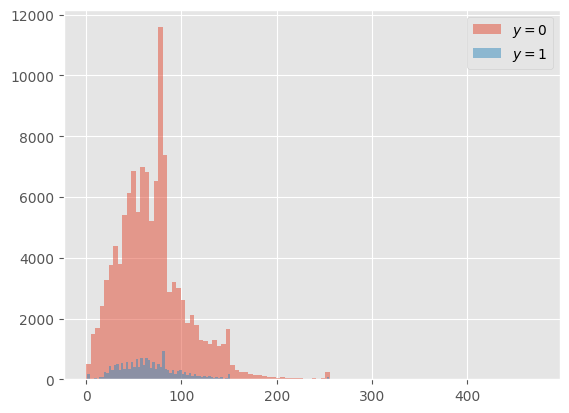

In [260]:
max_body_length = 5_000

bins=100
alpha=0.5

plt.hist(body_len_0[body_len_0 <= max_body_length], alpha=alpha, bins=bins, label=r'$y = 0$')
plt.hist(body_len_1[body_len_1 <= max_body_length], alpha=alpha, bins=bins, label=r'$y = 1$')
plt.legend();

In [261]:
title_exclamation_0 = train_df[train_df.target == 0].title.str.count('!')
title_exclamation_1 = train_df[train_df.target == 1].title.str.count('!')

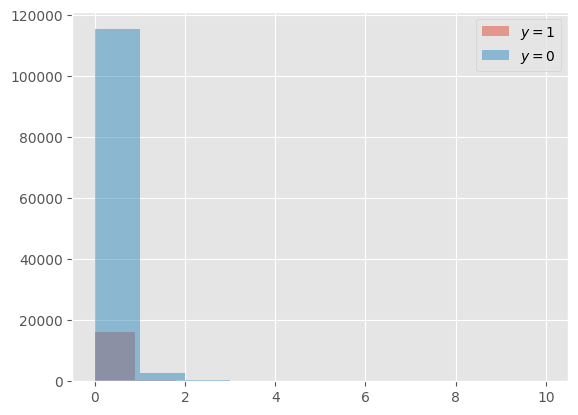

In [262]:
max_symbols = 25
title_max_symbols = 10

plt.hist(
    title_exclamation_1[title_exclamation_1 <= title_max_symbols],
    label=r'$y = 1$', bins=title_max_symbols, alpha=alpha
)
plt.hist(
    title_exclamation_0[title_exclamation_0 <= title_max_symbols],
    label=r'$y = 0$', bins=title_max_symbols, alpha=alpha
)
plt.legend()
plt.show()

In [263]:
train_df['target'].value_counts()

target
False    118594
True      16715
Name: count, dtype: int64

In [264]:
df = {'title': cleared_docs, 'target': y_train}

In [265]:
cleaned_train_df = pd.DataFrame(data = df)

In [271]:
SEED = 43
df_train, df_test = train_test_split(cleaned_train_df, test_size=0.2, random_state=SEED)
df_train, df_val = train_test_split(df_train, test_size=0.2, random_state=SEED)

In [272]:
x_train = df_train['title'].values
y_train = df_train['target'].values

x_val = df_val['title'].values
y_val = df_val['target'].values

In [273]:
x_train = df_train['title'].values
y_train = df_train['target'].values
np.count_nonzero(y_train == False) / np.count_nonzero(y_train == True)

7.072054436987323

In [274]:
x_val = df_val['title'].values
y_val = df_val['target'].values
np.count_nonzero(y_val == False) / np.count_nonzero(y_val == True)

7.084391336818522

# My baseline

## CountVectorizer

In [317]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB

vectorizer = CountVectorizer()
model = MultinomialNB()

In [318]:
x_train_sentence = [str(' '.join(text)) for text in x_train]
x_train_sentence = np.array(x_train_sentence, dtype = 'object')
x_train_sentence

array(['суп пюре тыква поиск mail ru',
       'полковой доска розовый липа сорт цена тг пог метр купить алматы satu kz id',
       'узнать последний научный открытие научно популярный портал', ...,
       'вакансия су шеф подольск работа ооо кренк база отдых фишерикс',
       'налогообложение малое бизнес современный условие тема научный статья экономика экономический наука читать бесплатно текст',
       'продажа авто шевроле круз омск владелец литр цена тысяча рубль автомат синий седан'],
      dtype=object)

In [319]:
x_val_sentence = [str(' '.join(text)) for text in x_val]
x_val_sentence = np.array(x_val_sentence, dtype = 'object')
x_val_sentence

array(['somoan tattoo designs tribal samoan tattoo designs',
       'папа кончить симпатичный лицо дочка пока жена готовить кухня',
       'мир mail ru', ...,
       'chery amulet красноперекопске ржавчина кузов кондера хэтчбек пробег чёрный бенз механик',
       'бой хутор избушенский яплакалъ', 'зимний шина r'], dtype=object)

In [320]:
x_train_vectorized = vectorizer.fit_transform(x_train_sentence)

In [321]:
feature_names = np.array(vectorizer.get_feature_names_out())

In [332]:
print(np.where(feature_names=='mail'))
print(feature_names[19718])

(array([19718], dtype=int64),)
mail


In [322]:
count_model.fit(x_train_sentence, y_train)

Pipeline(steps=[('vectorizer',
                 CountVectorizer(max_df=0.8, min_df=3,
                                 stop_words=['был', 'никогда', 'такой', 'тоже',
                                             'бы', 'я', 'чтоб', 'том', 'хоть',
                                             'ее', 'ним', 'только', 'между',
                                             'можно', 'в', 'вдруг', 'всю',
                                             'иногда', 'эти', 'через', 'потом',
                                             'ну', 'о', 'больше', 'этот', 'там',
                                             'раз', 'наконец', 'или', 'же', ...],
                                 token_pattern='[а-яё]+')),
                ('clf',
                 SGDClassifier(class_weight='balanced', loss='log_loss',
                               random_state=42))])

In [338]:
vectorizer = count_model.steps[0][1]

features = np.array(sorted(vectorizer.vocabulary_))

len(features)

15987

In [343]:
count_features = vectorizer.transform(x_train_sentence[[0]]).toarray()[0]

In [347]:
count_features.nonzero()

(array([ 9811, 10943, 13200, 13984], dtype=int64),)

In [344]:
x_train_sentence[[0]]

array(['суп пюре тыква поиск mail ru'], dtype=object)

In [345]:
pd.DataFrame({
    'token': features[count_features > 0], 
    'count': count_features[count_features > 0]
})

,token,count
0,поиск,1
1,пюре,1
2,суп,1
3,тыква,1


In [348]:
f1_score(y_train, count_model.predict(x_train_sentence))

0.6527889307554512

In [349]:
f1_score(y_val, count_model.predict(x_val_sentence))

0.6377875673029858

# ML baseline

In [350]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB

vectorizer = CountVectorizer()

model = MultinomialNB()

In [351]:
X_train

array(['Экс-министр экономики Молдовы - главе МИДЭИ, цель которого сделать из республики не просителя, а донора: Надо избегать долгого нахождения н�',
       'Эта песня стала известна многим телезрителям благодаря сериалу Диверсант-2',
       'Банши 4 сезон 2 серия Бремя красоты смотреть онлайн!', ...,
       '1941 Plymouth Special Deluxe Hot Rod, Automatic,Small Block,Power Steering, A/C for sale: photos, technical specifications, description',
       "Купить It's Skin Сыворотка питательная Power 10 Formula YE Effector, 30 мл в Москве - WOWCREAM",
       'Технический спирт в канистрах и флаконах, купить в Москве'],
      dtype=object)

In [353]:
X_train_vectorized = vectorizer.fit_transform(x_train_sentence)

In [354]:
X_train_vectorized

<86597x91316 sparse matrix of type '<class 'numpy.int64'>'
	with 653389 stored elements in Compressed Sparse Row format>

In [356]:
feature_names = np.array(vectorizer.get_feature_names_out())

In [357]:
feature_names

array(['aa', 'aaa', 'aaaaa', ..., 'ёрш', 'ёршик', 'ёсино'], dtype=object)

In [358]:
id_ = 42

print(X_train[id_])

x_vector = X_train_vectorized.getrow(id_).toarray()[0]

[feature for feature in feature_names[x_vector > 0]]

Презентация на тему "Приближенное значение. Абсолютная и относительная погрешнос


['ax',
 'payen',
 'головка',
 'оптом',
 'продажа',
 'прокладка',
 'розница',
 'цилиндр']

In [359]:
%%time

model.fit(
    X_train_vectorized,
    y_train
)

y_pred = model.predict(
    X_train_vectorized
)

CPU times: total: 15.6 ms
Wall time: 22.9 ms


In [360]:
f1_score(y_train, y_pred)

0.9043714649011269

### Submit

In [ ]:
x_test_sentence = [str(' '.join(text)) for text in x_]
x_train_sentence = np.array(x_train_sentence, dtype = 'object')
x_train_sentence

In [362]:
X_test_vectorized = vectorizer.transform(x_test)

test_df["target"] = model.predict(X_test_vectorized).astype(bool)

test_df[["id", "target"]].to_csv("ml_baseline.csv", index=False)

!cat ml_baseline.csv | head

NameError: name 'X_test' is not defined